In [1]:
pip install praw

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.8/188.8 KB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.9/55.9 KB 7.7 MB/s eta 0:00:00


In [2]:
%pip install 'networkx<2.7'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 62.1 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found existing installation: networkx 3.0
    Uninstalling networkx-3.0:
      Successfully uninstalled networkx-3.0


In [3]:
#required libraries

import numpy as np 
import pandas as pd
import praw #for reddit wrapper
import matplotlib.pyplot as plt #for basic visualizations
import networkx as nx #to create Network Graphs

In [4]:
CLIENT_ID = 'Ux2mwTmVZUjy27KYE7yyqw'
SECRET_KEY = 'eYSz60DBIw9AJ4MrwS9nZeaf34WS1g'


In [6]:
import requests

In [7]:
auth = requests.auth.HTTPBasicAuth(CLIENT_ID, SECRET_KEY)

In [8]:
with open('pw.txt', 'r') as f:
  pw = f.read()

In [9]:
data = {'grant_type': 'password',
        'username': 'freedom-n-faith',
        'password': pw
}

In [10]:
headers = {'User-Agent': 'project v1.0 being done by /u/freedom-n-faith'}

In [11]:
res = requests.post('https://www.reddit.com/api/v1/access_token',
                    auth=auth, data=data, headers=headers)

In [12]:
TOKEN = res.json()['access_token']

In [13]:
headers = {**headers, **{'Authorization': f"bearer {TOKEN}"}}


In [14]:
requests.get('https://oauth.reddit.com/api/v1/me', headers=headers)

<Response [200]>

In [15]:
#Setting up the Reddit API in python
reddit = praw.Reddit(client_id=CLIENT_ID,
                     client_secret=SECRET_KEY,
                     user_agent = 'project v1.0 being done by /u/freedom-n-faith',
                     check_for_async = False)

\It starts from here

In [16]:
def get_posts(subred_name, n):
    subreddit = reddit.subreddit(subred_name)
    posts_info = [] 
    
    for subm in subreddit.top(limit=n):
        
        subred_info = []
        subred_info.append(subm.id)  
        subred_info.append(str(subm.author)) 
        subred_info.append(str(subm.subreddit))
        posts_info.append(subred_info)
    
    sorted_info = sorted(posts_info, key=lambda x: x[1], reverse = True)
    posts_df = pd.DataFrame(sorted_info, columns = ['id', 'author', 'subreddit'])
    return posts_df

In [17]:
#Possibly the subreddits in which they have posts

meme_df = get_posts('india', 1000)
meme_df.head()

KeyboardInterrupt: ignored

In [ ]:
#frequent posters 
freq_posters = meme_df[meme_df.duplicated(['author'], keep = False)]
#Removing deleted users
freq_posters = freq_posters[freq_posters.author != 'None']

In [ ]:
freq_posters.author.nunique()

104

Text(0, 0.5, 'Number of posts')

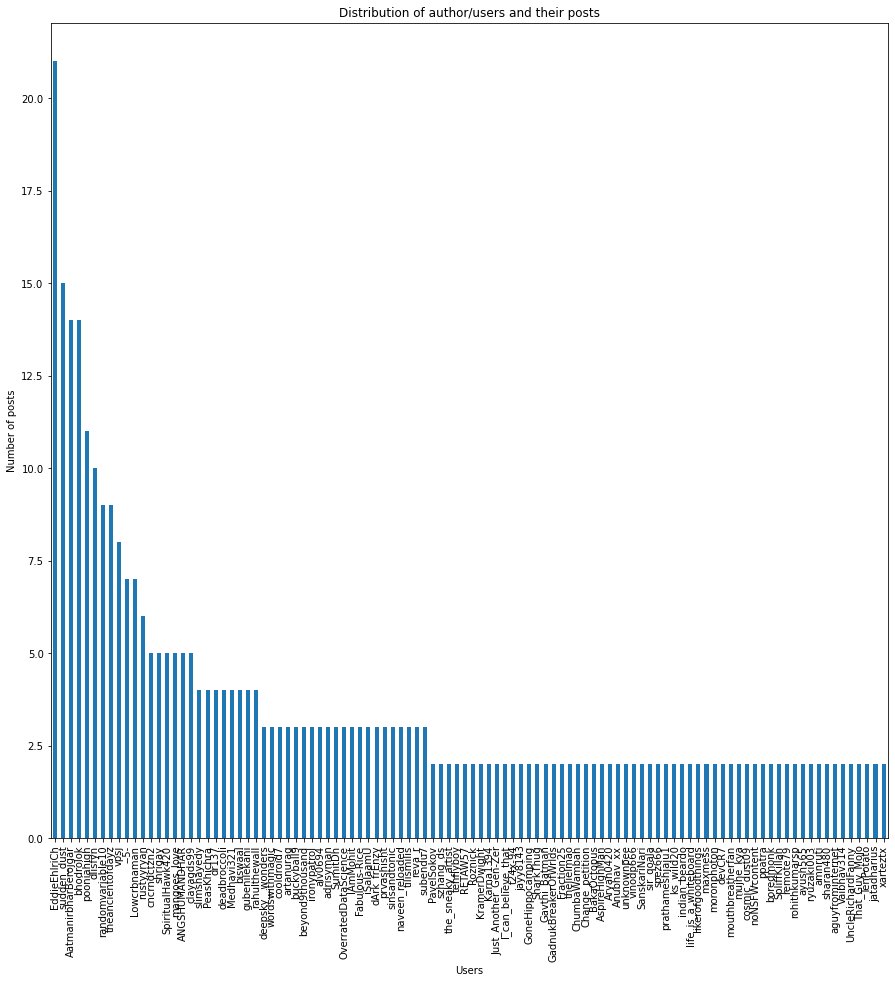

In [ ]:
plt.figure(figsize=(15, 15))
ax = freq_posters['author'].value_counts().plot(kind='bar',title='Distribution of author/users and their posts')
ax.set_xlabel("Users")
ax.set_ylabel("Number of posts")

In [ ]:
authors_lst = list(freq_posters.author.unique())

In [ ]:
print(authors_lst)

['zDark_Knight21', 'tyronewheresmychiken', 'the_physics_bro', 'tearose11', 'tamilvanan31', 'smol_boi-_-', 'salaamtom', 'raunak_9000', 'randomphilia696925', 'purple-circle', 'planet_taz', 'noop-master-69', 'mr_nothingness_123', 'mikeschwally1', 'm-ego', 'jubu_jubu', 'ipostradnomstuff', 'imakememes420', 'ghosty0310', 'elch3w', 'cjconair', 'asilvertintedrose', 'arrowforlyf', 'aaravaryaman', '_Mrbolt_', 'YoutubeMaikEyy', 'Wheyprotein200', 'UnwantedJason', 'Unknownghost17', 'Thedepressionoftrees', 'The_Negotiator1012', 'TPOHgames87', 'Still-Following-104', 'Silent_Rampage97', 'Shao15', 'Serg3ant_Redd1tor263', 'Secure_Candy6472', 'STEELJAW116', 'Rishi_J3107', 'PorterWill', 'Poohbizzle79', 'Political_LOL_center', 'PlaneAd5123', 'PixelatedCouchPotato', 'Piehnat', 'Onion-User-2', 'Odd_Diamond_6600', 'NotTommy13', 'My_Bird_Buddy', 'Mustachioed_Pizza', 'MrYoshirin', 'MemeGuyReddit', 'ManWhoCanXD', 'LazerDaYeeter', 'Latter-Signature1581', 'Larry-the-Lumberjack', 'KLASHINOV', 'JuanLowTechie', 'Jont

In [ ]:
def get_posts_u(usr_name, n):
    user = reddit.redditor(usr_name)
    posts_info = [] 
    
    for subm in user.submissions.top(limit=n):
        
        subred_info = []
        subred_info.append(subm.id)  
        subred_info.append(str(subm.author)) 
        subred_info.append(str(subm.subreddit))
        posts_info.append(subred_info)
    
    sorted_info = sorted(posts_info, key=lambda x: x[1], reverse = True)
    posts_df = pd.DataFrame(sorted_info, columns = ['id', 'author', 'subreddit'])
    return posts_df

In [ ]:
authors_df =  pd.DataFrame() 
authors_df = authors_df.fillna(0)
for u in authors_lst:
  try: 
    c = get_posts_u(u, 10)
    authors_df = pd.concat([authors_df, c])
  except:
    continue
      

In [ ]:
authors_df.head()

,id,author,subreddit
0,dqjwdk,xarteztx,pics
1,fvioqr,xarteztx,pics
2,8w2dj1,xarteztx,pics
3,fviqcu,xarteztx,Art
4,dqjw67,xarteztx,Art


In [ ]:
#might be redundant
nx_df = authors_df[['author', 'subreddit']]
nx_df.head()

,author,subreddit
0,xarteztx,pics
1,xarteztx,pics
2,xarteztx,pics
3,xarteztx,Art
4,xarteztx,Art


In [ ]:
#dropping all posts made on the user page itself
nx_df = nx_df[("u_" + nx_df['author']) != nx_df['subreddit']]
nx_df.head()

,author,subreddit
0,xarteztx,pics
1,xarteztx,pics
2,xarteztx,pics
3,xarteztx,Art
4,xarteztx,Art


In [ ]:
#Getting the list of subreddits posted by the same authors
list1 = []
authors = nx_df['author'].unique()
for author in authors:
  subreddit_values = nx_df[nx_df['author'] == author]['subreddit'].tolist()
  list1.append(subreddit_values)



In [ ]:
#Creating a graph
G = nx.Graph()

In [ ]:
#add edges to subreddits with similar posters
for li in list1:
  res = [(a, b) for idx, a in enumerate(li) for b in li[idx + 1:]]
  res = [*set(res)]
  G.add_edges_from(res)


In [ ]:
#removing self loops
G.remove_edges_from(nx.selfloop_edges(G))

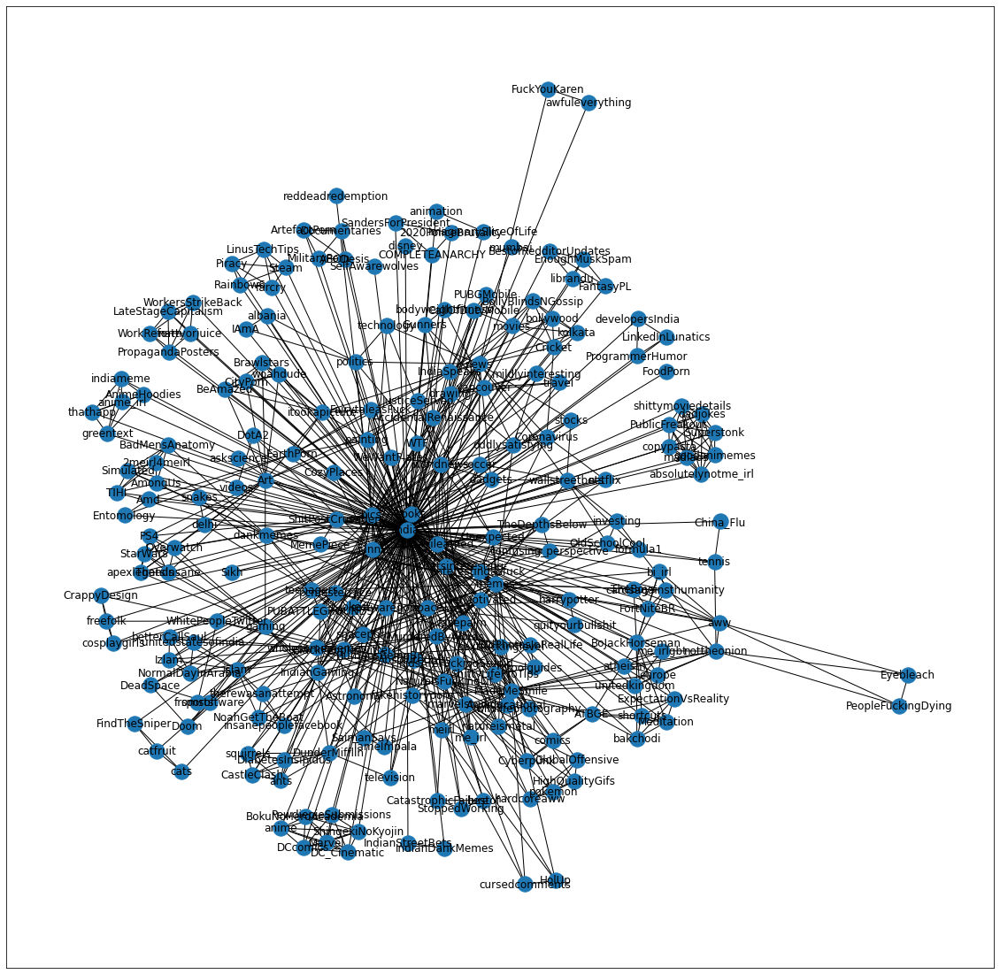

In [ ]:
#Drawing the Graph
from matplotlib.pyplot import figure
figure(figsize=(20, 20))
nx.draw_networkx(G, with_labels=True)

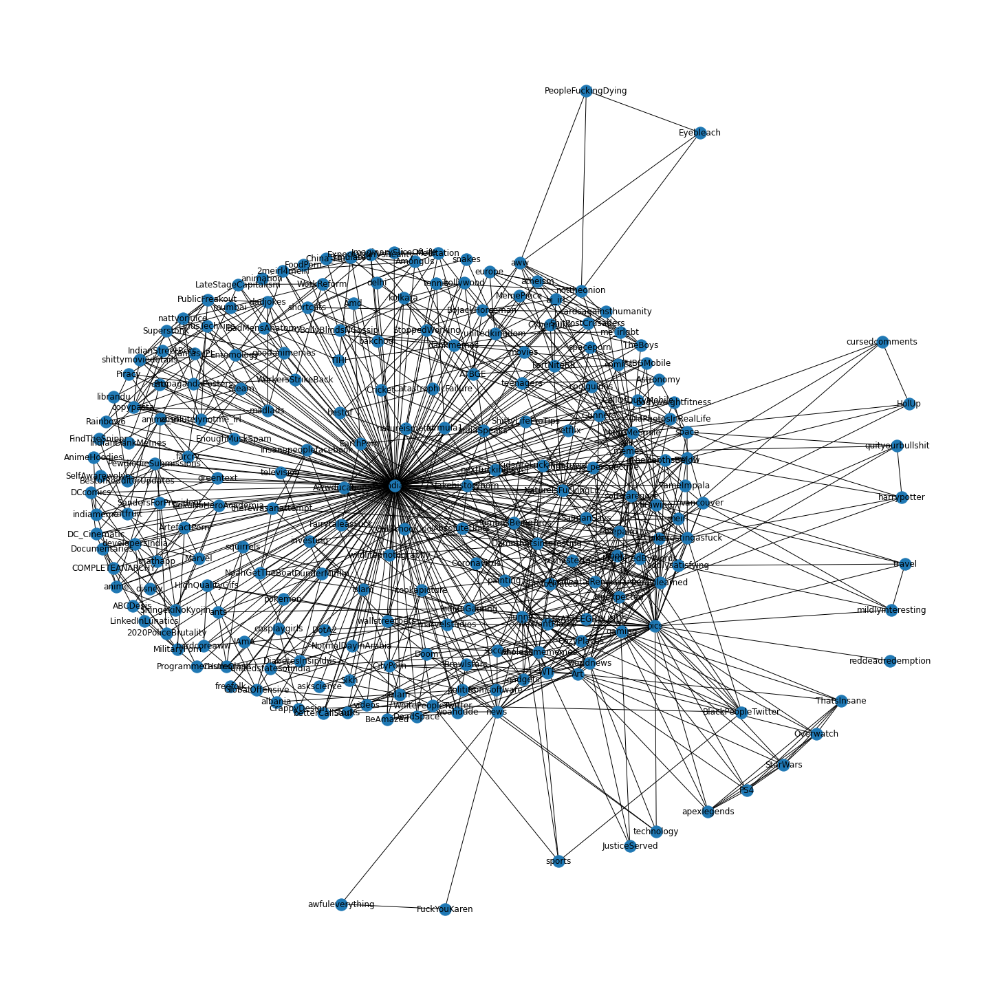

In [ ]:
figure(figsize=(20, 20))
nx.draw_kamada_kawai(G, with_labels=True)

In [ ]:
figure(figsize=(20, 20))
nx.draw_shell(G, with_labels=True)

Output hidden; open in https://colab.research.google.com to view.

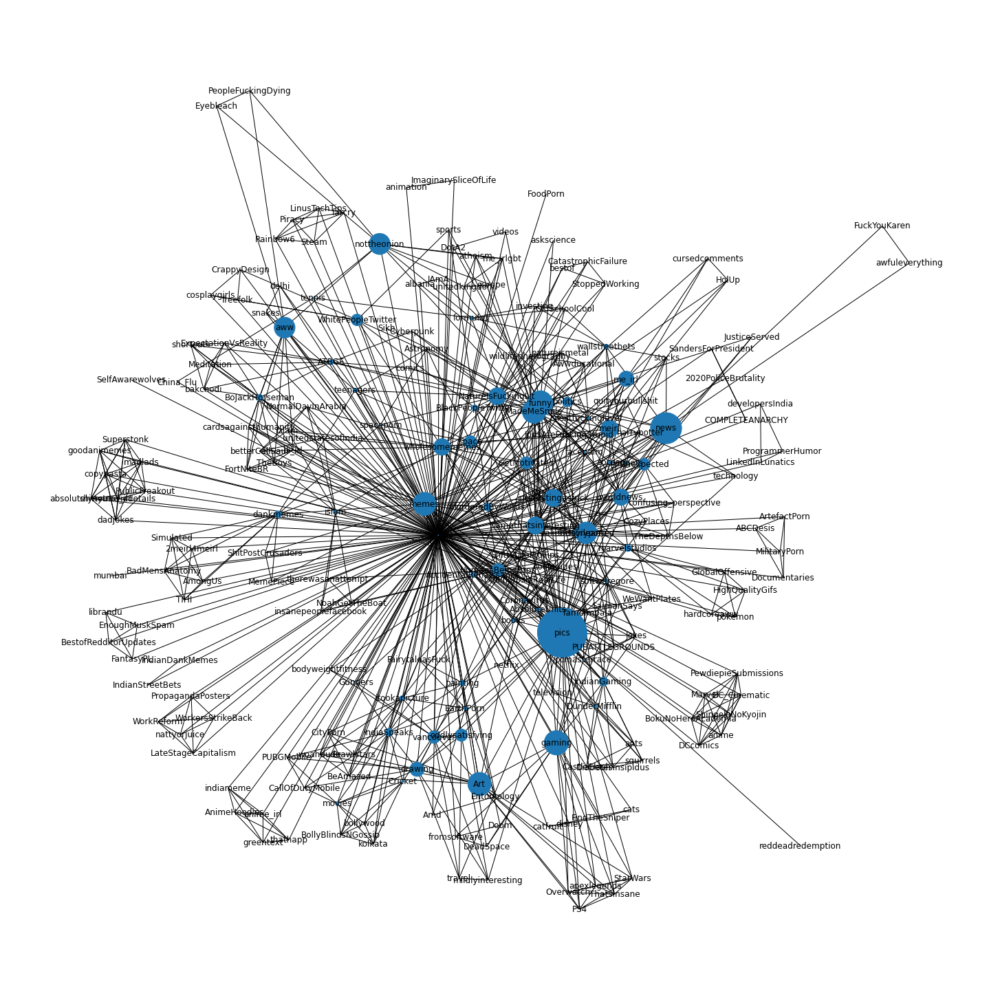

In [ ]:
#betweenness centrality

c = nx.betweenness_centrality(G)
sizes = [c[node] * 100000 for node in G.nodes()]
sizes[sizes.index(max(sizes))] = sizes[sizes.index(max(sizes))]/100000
figure(figsize=(20, 20))
nx.draw(G, with_labels=True, node_size=sizes)
plt.show()

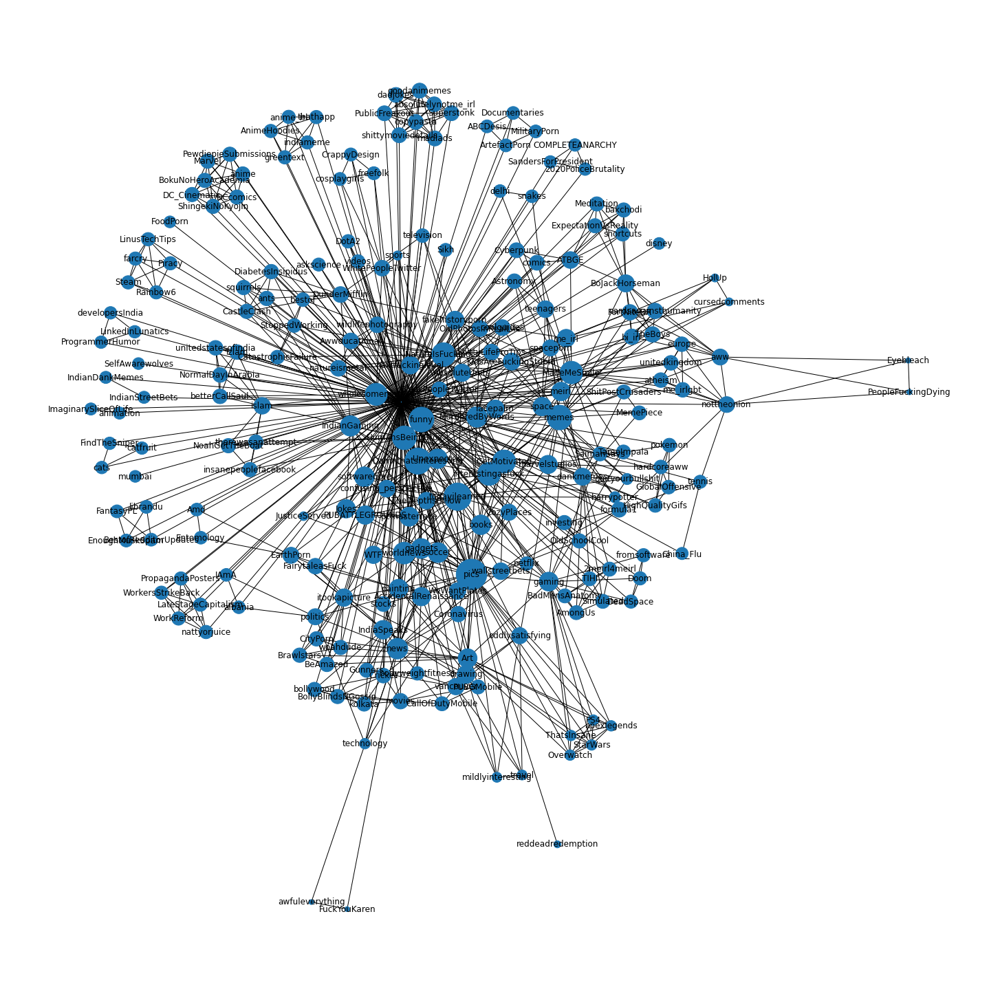

In [ ]:
#eigenvector centrality
c = nx.eigenvector_centrality(G)
sizes = [c[node] * 10000 for node in G.nodes()]
sizes[sizes.index(max(sizes))] = sizes[sizes.index(max(sizes))]/10000
figure(figsize=(20, 20))
nx.draw(G, with_labels=True, node_size=sizes)
plt.show()

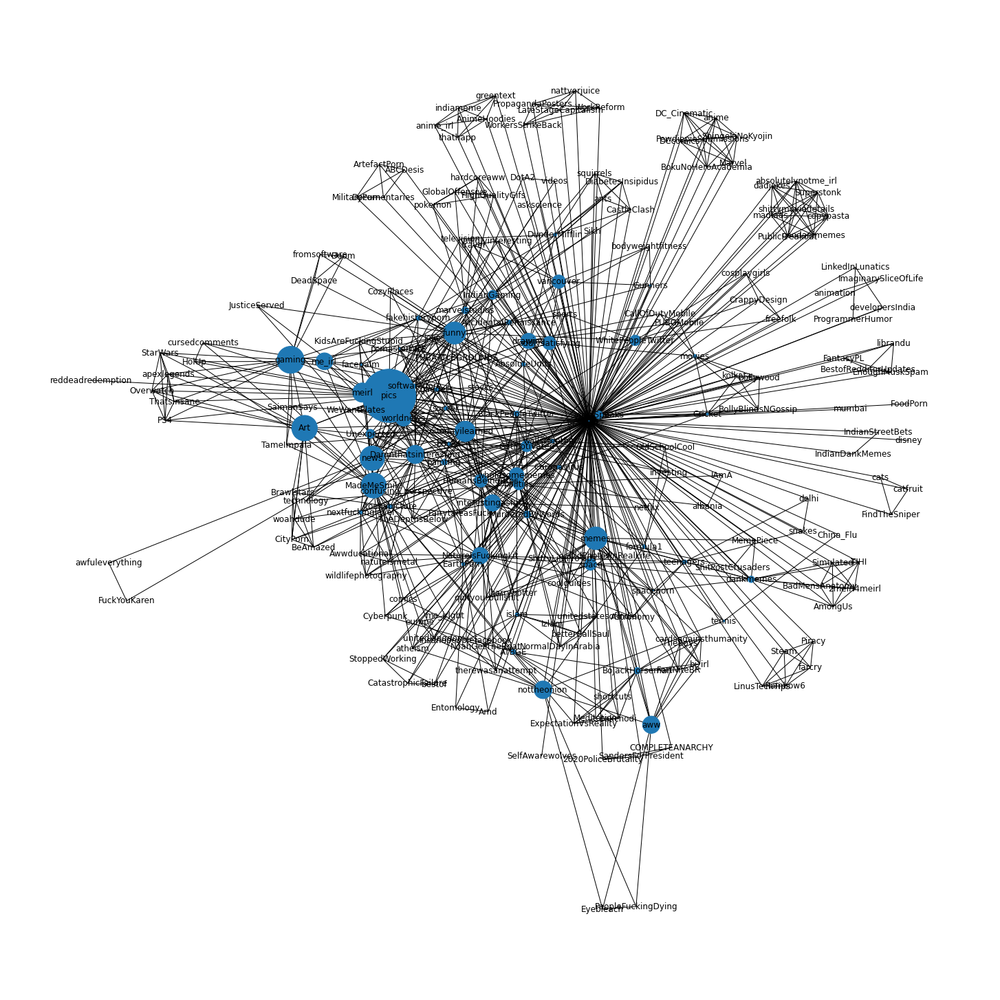

In [ ]:
#percolation centrality
import random

for node in G.nodes():
    G.nodes[node]['percolation'] = random.random()

c = nx.percolation_centrality(
    G=G,
    attribute='percolation',
)

sizes = [c[node] * 100000 for node in G.nodes()]
sizes[sizes.index(max(sizes))] = sizes[sizes.index(max(sizes))]/100000
from matplotlib.pyplot import figure
figure(figsize=(20, 20))
nx.draw(G, with_labels=True, node_size=sizes)
plt.show()

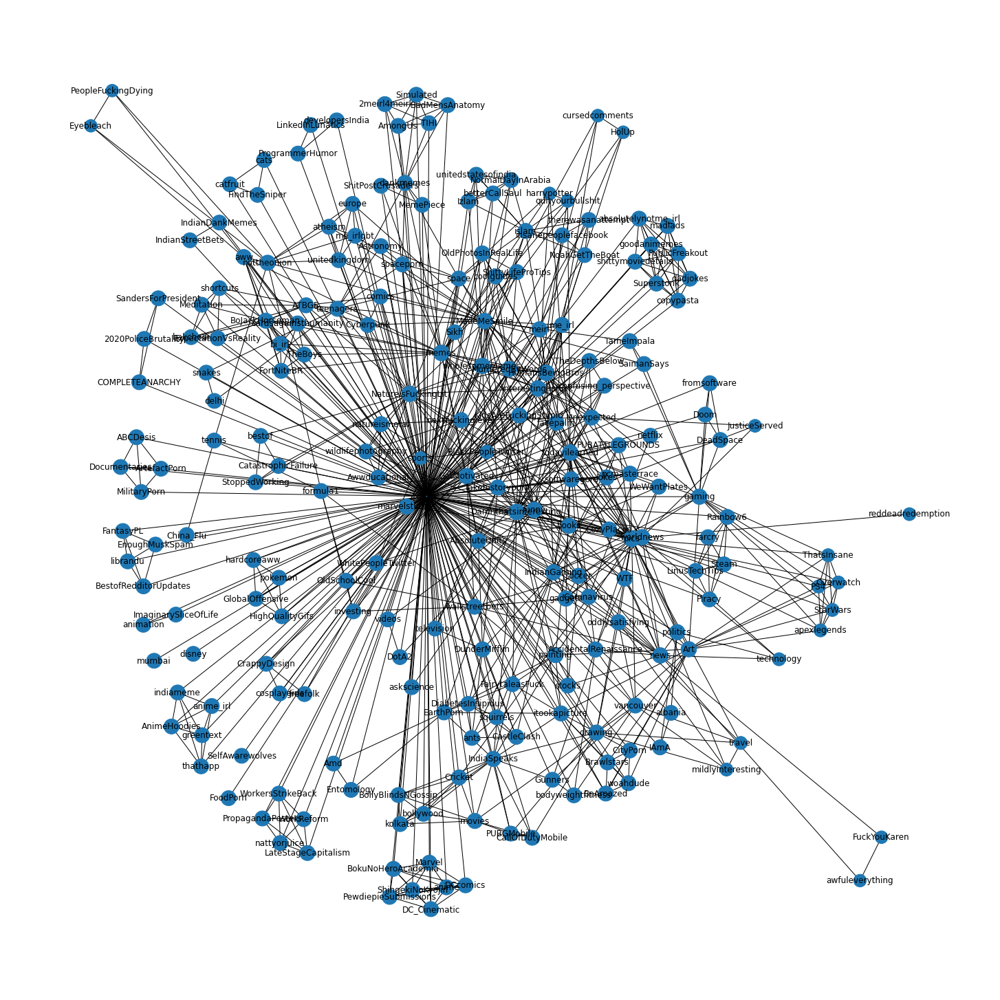

In [ ]:
#closeness centrality

c = nx.closeness_centrality(G)
sizes = [c[node] * 1000 for node in G.nodes()]
sizes[sizes.index(max(sizes))] = sizes[sizes.index(max(sizes))]/1000
figure(figsize=(20, 20))
nx.draw(G, with_labels=True, node_size=sizes)
plt.show()

It can be deduced from the uniform values of closeness centrality throughout the network, that the network is highly traceable i.e one can reach all nodes from any given node in an efficient manner

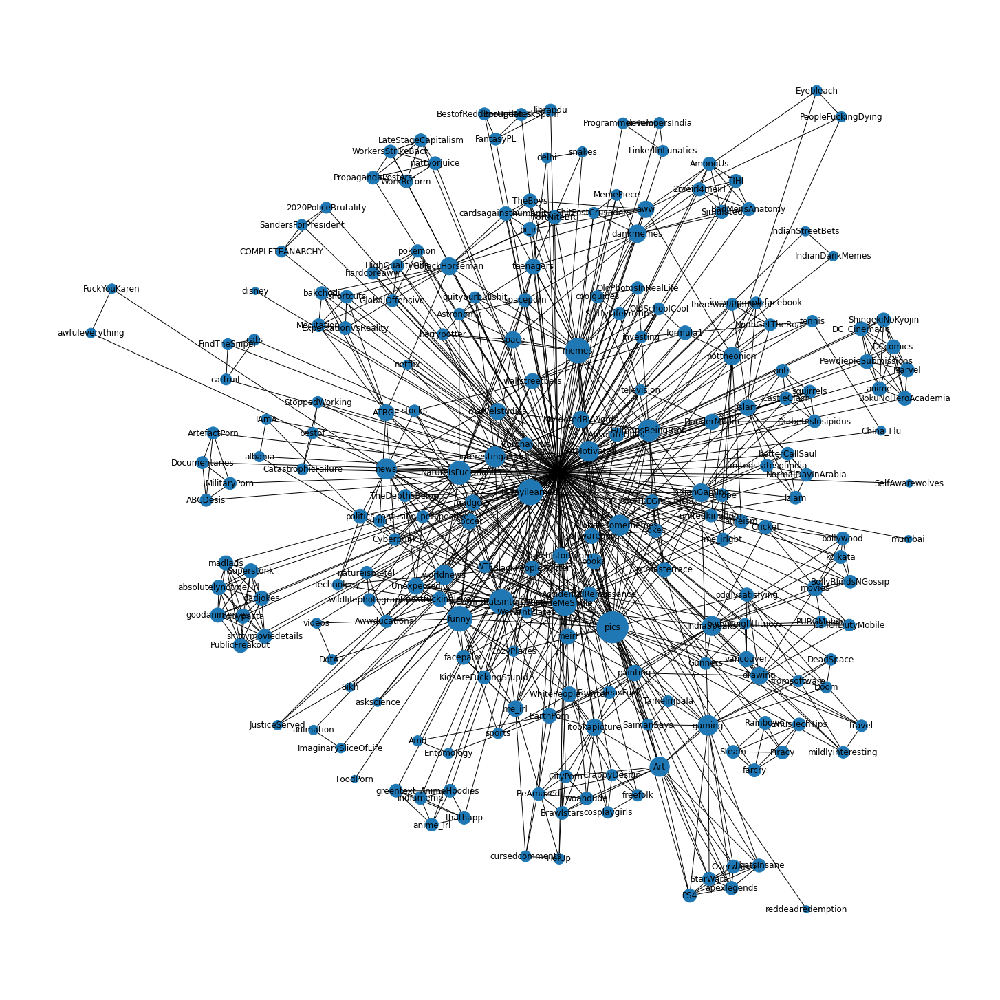

In [ ]:
#pagerank

c = nx.pagerank(G)
sizes = [c[node] * 100000 for node in G.nodes()]
sizes[sizes.index(max(sizes))] = sizes[sizes.index(max(sizes))]/100000
figure(figsize=(20, 20))
nx.draw(G, with_labels=True, node_size=sizes)
plt.show()


/usr/local/lib/python3.8/dist-packages/matplotlib/collections.py:885: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


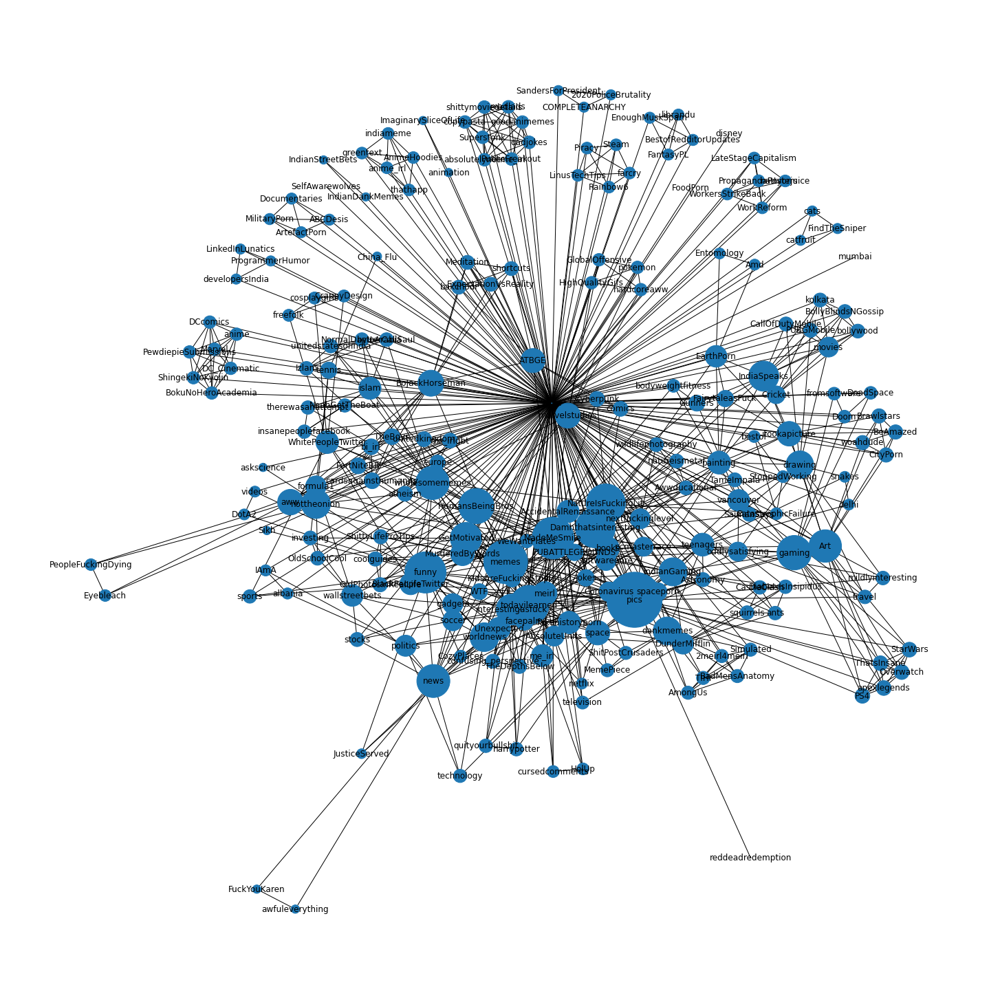

In [ ]:
#current_flow_betweenness_centrality centrality

c = nx.current_flow_betweenness_centrality(G, dtype=float, solver="lu")
sizes = [c[node] * 50000 for node in G.nodes()]
sizes[sizes.index(max(sizes))] = sizes[sizes.index(max(sizes))]/50000
figure(figsize=(20, 20))
nx.draw(G, with_labels=True, node_size=sizes)
plt.show()

In [ ]:
#look for communities and structural holes
from networkx.algorithms import community

com = community.greedy_modularity_communities(G)


In [ ]:
print(len(com))


12


In [ ]:

com2 = community.asyn_fluidc(G, 12)


In [ ]:
#function to color the graph based on communities
def color_g(c):
  num_colors = len(c)
  colors = plt.cm.get_cmap('tab20', num_colors)
  color_map = []
  for node in G:
      for i in range(len(c)):
          if node in c[i]:
              color_map.append(colors(i))

  return color_map

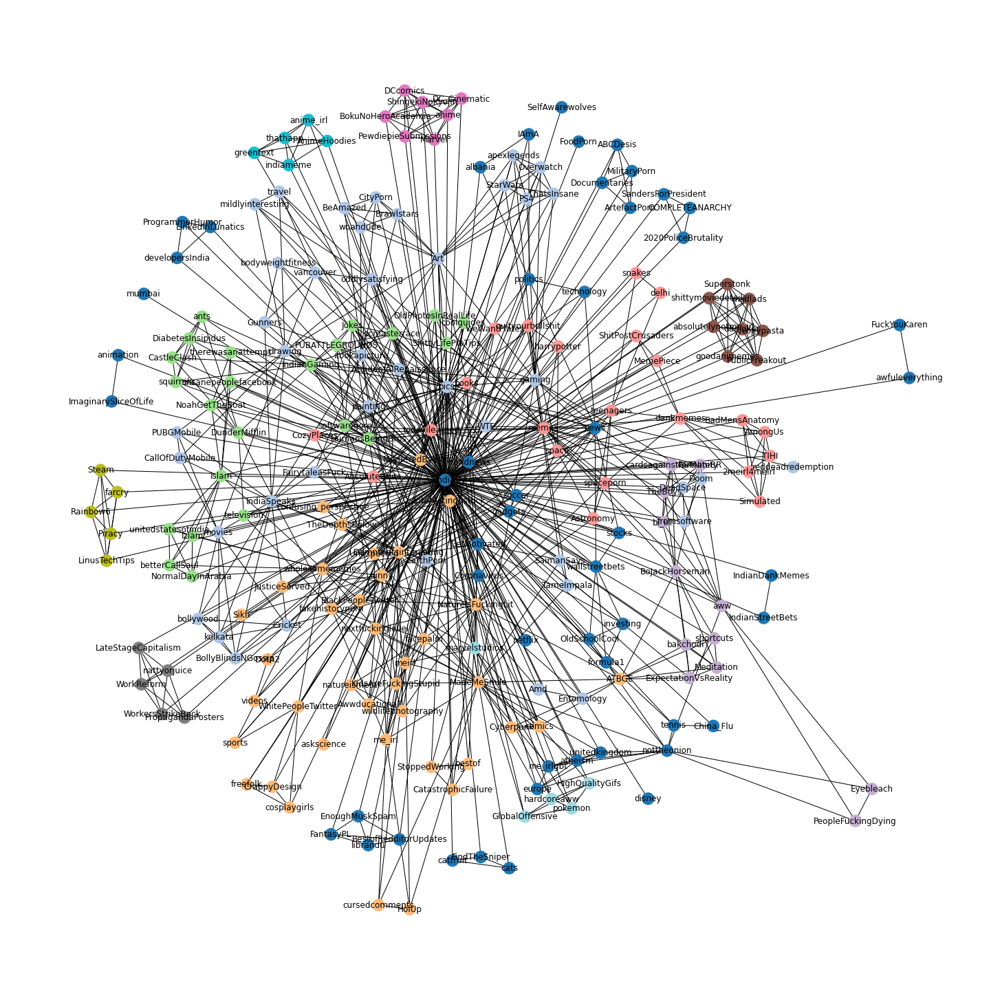

In [ ]:

# greedy modularity
figure(figsize=(20, 20))
nx.draw(G, node_color=color_g(com), with_labels=True)
plt.show()

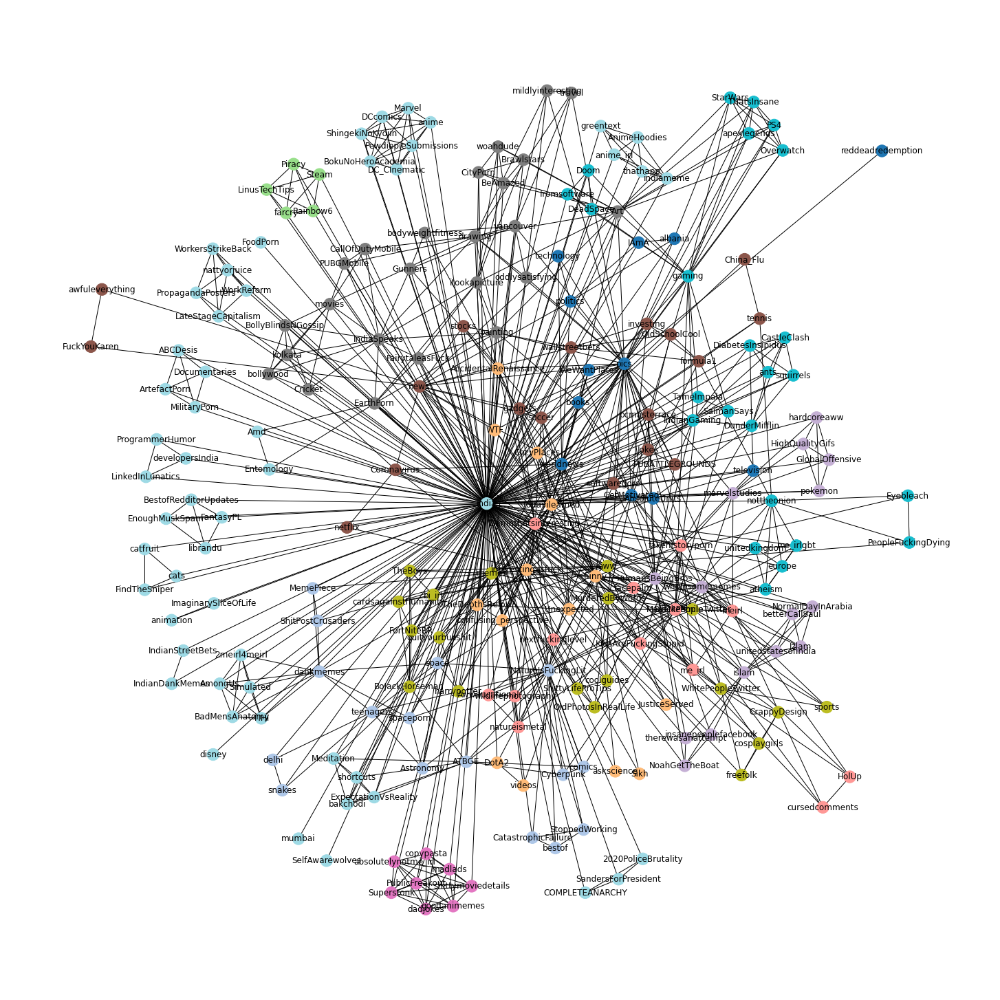

In [ ]:
#asyn_fluidc
figure(figsize=(20, 20))
nx.draw(G, node_color=color_g(list(com2)), with_labels=True)
plt.show()

In [ ]:
print(community.modularity(G, com, 1))

0.4998757206884941


In [ ]:
print(community.modularity(G, com2, 1))

0.47171626441376985
